In [23]:
%reload_ext cython



In [24]:
%%cython
import numpy
import math
import numpy.random as nprand
import pandas as pd
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib
import seaborn as sns
import scipy
from scipy import stats
from numpy.random import rand
from numpy.random import seed
from numpy.random import randn
from matplotlib import pyplot as plt
import ctmatching
import collections
#Treatment of the Treated
def TT_psm(control, treatment):
    elected_control_index, selected_control_index_for_each_treatment = ctmatching.psm(control, treatment,use_col=[19],independent=True,k=3 )    
    array = numpy.arange(0,len(treatment),1)
    var = []
    for x in array:
        b = selected_control_index_for_each_treatment[x]
        dat = []
        for z in b:
            c = control.iloc[z,18]
            dat.append(c)
            means = numpy.mean(dat)
        var.append(means)
    var = numpy.asarray(var)
    treatment['mult'] = var
    return numpy.mean(treatment.Y - treatment.mult)
# Treatment Effect on the Untreated
def TUT_psm(control,treatment):
    selected_control_index2, selected_control_index_for_each_treatment2 = ctmatching.psm(treatment, control,use_col=[19],independent=True,k=3 ) 
    array = numpy.arange(0,len(control),1)
    var = []
    for x in array:
        b = selected_control_index_for_each_treatment2[x]
        dat = []
        for z in b:
            c = treatment.iloc[z,18]
            dat.append(c)
            means = numpy.mean(dat)
        var.append(means)
    var = numpy.asarray(var)
    control['mult'] = var
    return numpy.mean(control.mult - control.Y)
#Average Treatment Effect
def ATE_psm(control,treatment):
    a = TT_psm(control,treatment)
    b = TUT_psm(control,treatment)
    return ((len(treatment) / (len(treatment)+len(control))) * a) + ((len(control) / (len(treatment)+len(control))) * b)

#Estimation menue inserted under Buchstabe
V = 'D ~ x3 +theta_cog + theta_soc '
W = 'D ~ theta_cog + theta_soc '
X = 'D ~ x3 + theta_soc '
Y = 'D ~ x3 + M1 '
Z = 'D ~ x3 '
# if OLS is chosen
V_1 = 'Y ~ D + x + x3+ theta_cog+ theta_soc'
W_1 = 'Y ~ D + x + theta_cog+ theta_soc'
X_1 = 'Y ~ D + x + x3 + theta_cog'
Y_1 = 'Y ~ D + x + x3 + M1'
Z_1 = 'Y ~ D + x + x3'

def cov_var(num, rho_1, rho_2, Buchstabe):
#creation ob observables
    NumAgents = num
    mean = [0,0,0]
    correlation1 = 0
    correlation2 = 0
    correlation12 = 0
    cov = [[1,correlation1,correlation2],[correlation1,1,correlation12],[correlation2, correlation12, 1]]
    test = nprand.multivariate_normal(mean,cov,NumAgents)
    df_test = pd.DataFrame(data=test, columns=['x','theta_cog','theta_soc'])
    df_test['constant'] = ([1,]*NumAgents)
    df_test['index']=df_test.index
    theta_cog = df_test['theta_cog']
    theta_soc = df_test['theta_soc']
    x = df_test['x']
#creation of measurements
    theta_line_cog = numpy.column_stack((theta_cog,theta_cog,theta_cog,theta_cog))
    theta_line_soc = numpy.column_stack((theta_soc,theta_soc,theta_soc,theta_soc))
    jota_cog = ([[1,1,1,1],]*NumAgents)
    #jota_soc = ([[0.9,0.9,0.9,0.9],]*NumAgents)
    jota_soc = ([[0,0,0,0],]*NumAgents)
    delta = ([[0,0,0,0],]*NumAgents)
    x_row = numpy.column_stack((x,x,x,x))
    v1 = randn(NumAgents)
    v2 = randn(NumAgents)
    v3 = randn(NumAgents)
    v4 = randn(NumAgents)
    epsilon = numpy.column_stack((v1,v2,v3,v4))
    measurement = numpy.multiply(jota_cog,theta_line_cog) + numpy.multiply(jota_soc,theta_line_soc)+ numpy.multiply(delta,x_row) + epsilon
    df_m = pd.DataFrame(data=measurement, columns=['M1','M2','M3','M4'])
    df_m['index'] = df_m.index
    df = df_test.merge(df_m, on='index')
# creation unobservables
    mean_unobs = [0,0,0]
    cov_unobs = [[1,0,rho_1],[0,1,rho_2],[rho_1,rho_2,1]]
    unobs = nprand.multivariate_normal(mean_unobs,cov_unobs,NumAgents)
    df_unobs = pd.DataFrame(data=unobs, columns=['u1','u0','uc'])
    df_unobs['index'] = df_unobs.index
    df = df.merge(df_unobs, on='index')
# creation outcomes
    df['Y1'] = 1*df['constant'] + 0*df['x'] +  2*df['theta_cog']+ 0.1*df['theta_soc']+df['u1']
    df['Y0'] = 0*df['constant'] + 0*df['x'] + 1*df['theta_cog'] + 0.1*df['theta_soc'] + df['u0']
    df['x3'] = randn(NumAgents)
# model structure can be choosen freely
    #df['cost'] =  1.1*df['constant'] + -0.39*df['x3'] + 0.52*df['theta_soc'] + -0.58*df['theta_cog']+ df['uc']
    df['cost'] =  0*df['constant'] + 1*df['x3'] + 1*df['theta_soc'] + 1*df['theta_cog']+ df['uc']
    #df['expected_benefit'] = (df['cost'])
    df['expected_benefit'] = ((df['Y1'] - df['u1']) - (df['Y0'] - df['u0'])) - (df['cost'])
    df['D'] = 0
    df.loc[df.expected_benefit > 0, 'D'] = 1
    df['D_1'] = 0
    df.loc[df.D == 0, 'D_1'] = 1
    df['Y'] = df.Y1
    df.loc[df['D'] == 0, 'Y'] = df.Y0 
    test = df.groupby('D').mean()
    benefit = df['Y1'] - df['Y0']
# define effects
    TT = numpy.mean(df[df.D == 1]["Y1"] - df[df.D == 1]["Y0"])
    ATE = numpy.mean(benefit)
    TUT = numpy.mean(df[df.D == 0]["Y1"] - df[df.D == 0]["Y0"])
# perform psm
#    logit_psm = smf.probit(Buchstabe, data=df)
#    results_psm =logit_psm.fit()
    #OLS_psm = smf.ols(Buchstabe, data=df)
    #results_OLS = OLS_psm.fit()
    #c = results_OLS.params[1]
#    df['pred_values'] = results_psm.predict()
    #df = df.loc[(df.pred_values > x) & (df.pred_values < x+0.2)]
    treatment_t = df[df.D == 1]
    control_t = df[df.D == 0]
    #a = TT_psm(control_t,treatment_t)
    #b = TUT_psm(control_t,treatment_t)
    #c = ATE_psm(control_t,treatment_t)
# calculate bias
    #diff = c - ATE
    #diff_2 = a - TT
    return treatment_t, control_t, ATE, TT, TUT
# bias over range des PSM as in Heckman
#repeat = numpy.arange(0,100,1)
#corr_array = numpy.arange(0,1,0.2)

#file_bias = []
#for x in corr_array:
#    file_V =[]
#    for y in repeat:
#        psm_X = cov_var(20000,0,0,W,x)
#        file_V.append(psm_X)
#        meanbias = numpy.mean(file_V)
#    file_bias.append(meanbias)
#print(plt.scatter(corr_array,file_bias))

#file_bias_2 = []
#for x in corr_array:
#    file_W =[]
#    for y in repeat:
#        psm_X2 = cov_var(20000,0,0,Z,x)
#        file_W.append(psm_X2)
#        meanbias_2 = numpy.mean(file_W)
#    file_bias_2.append(meanbias_2)
#plt.scatter(corr_array,file_bias)
#plt.scatter(corr_array,file_bias_2, color="red")


In [25]:
import sklearn.neighbors
from sklearn.neighbors import NearestNeighbors
data = cov_var(50000,0,0,W)
a = data[0]
b = data[1]
a_1= a.reset_index()
b_1= b.reset_index()
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

def get_matching_pairs(treated_df, non_treated_df, scaler=True):

    treated_x = treated_df.values
    non_treated_x = non_treated_df.values
    if scaler == True:
        scaler = StandardScaler()
    if scaler:
        scaler.fit(treated_x)
        treated_x = scaler.transform(treated_x)
        non_treated_x = scaler.transform(non_treated_x)

    nbrs = NearestNeighbors(n_neighbors=1, algorithm='ball_tree').fit(non_treated_x)
    distances, indices = nbrs.kneighbors(treated_x)
    indices = indices.reshape(indices.shape[0])
    matched = non_treated_df.ix[indices]
    return matched
get_matching_pairs(a_1,b_1)

/home/christian/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


,level_0,x,theta_cog,theta_soc,constant,index,M1,M2,M3,M4,...,u0,uc,Y1,Y0,x3,cost,expected_benefit,D,D_1,Y
1520,5295,1.282102,-0.797554,0.308117,1,5295,0.407886,-0.218044,0.283773,-1.314792,...,-0.591617,0.500133,-1.105888,-1.358359,0.213953,0.224649,-0.022204,0,1,-1.358359
415,1517,0.452943,-1.507800,-0.083162,1,1517,-1.726701,-0.211816,-2.124621,-3.052793,...,-0.713703,0.035194,-0.008658,-2.229818,1.182514,-0.373254,-0.134546,0,1,-2.229818
1285,4469,0.243535,-0.166959,1.607042,1,4469,-0.788310,0.547256,1.135562,0.312379,...,1.051384,-0.133683,1.952382,1.045130,-0.215752,1.090648,-0.257607,0,1,1.045130
1761,6134,-0.083740,-1.813094,0.439587,1,6134,-0.335037,-3.278031,-1.365803,-1.677216,...,0.434503,-1.297480,-2.074054,-1.334632,2.044348,-0.626639,-0.186455,0,1,-1.334632
1248,4343,-0.044928,-0.935707,0.322973,1,4343,-1.722974,0.315310,-0.366822,-0.979182,...,-1.537978,0.193058,-0.968613,-2.441388,0.718838,0.299162,-0.234869,0,1,-2.441388
2998,10600,1.961843,0.593482,-0.946515,1,10600,1.048330,1.011258,1.359667,-0.080429,...,-0.216517,1.305691,2.452017,0.282314,0.741431,1.694089,-0.100607,0,1,0.282314
1974,6953,-0.783490,0.611558,-0.240728,1,6953,0.861233,1.612404,-0.219375,0.566320,...,1.193579,-0.282372,1.818272,1.781065,1.569166,1.657624,-0.046065,0,1,1.781065
404,1472,0.080030,0.767950,1.435226,1,1472,0.343510,2.358043,-0.217028,0.647244,...,-1.137021,-0.761955,1.630773,-0.225548,0.418546,1.859768,-0.091818,0,1,-0.225548
2100,7474,0.805029,-0.210293,-0.057380,1,7474,0.171627,-0.410427,1.591847,1.044033,...,-0.447259,0.921826,-0.813227,-0.663290,0.483973,1.138126,-0.348419,0,1,-0.663290
2105,7485,0.342412,-0.448029,0.759739,1,7485,0.390884,-2.455355,0.537551,-0.337807,...,1.392844,-0.165728,-0.863747,1.020789,0.487787,0.633770,-0.081799,0,1,1.020789


In [26]:
data[2]

0.9954857262433489

In [27]:
data[3:]

(0.9971399673576435, 0.9912713668386468)

In [6]:
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

def get_matching_pairs(treated_df, non_treated_df, scaler=True):

    treated_x = treated_df.values
    non_treated_x = non_treated_df.values
    if scaler == True:
        scaler = StandardScaler()
    if scaler:
        scaler.fit(treated_x)
        treated_x = scaler.transform(treated_x)
        non_treated_x = scaler.transform(non_treated_x)

    nbrs = NearestNeighbors(n_neighbors=1, algorithm='ball_tree').fit(non_treated_x)
    distances, indices = nbrs.kneighbors(treated_x)
    indices = indices.reshape(indices.shape[0])
    matched = non_treated_df.ix[indices]
    return matched

In [8]:
#!pip install pandas==0.23.4
from pymatch.Matcher import Matcher
m=Matcher(a,b,yvar='D',exclude=['level_0','u0','index','constant','M1','M2','M3','M4','u1','u2','uc','Y1','Y0','cost','experinced','Y','pred_values','expected_benefit','x3','x','D_1'])


Formula:
D ~ theta_cog+theta_soc
n majority: 36028
n minority: 13972


In [30]:
def matching_all(num, rho_1, rho_2, Buchstabe):
    data = cov_var(num, rho_1, rho_2, Buchstabe)
    a = data[0]
    b = data[1]
    m=Matcher(a,b,yvar='D',exclude=['level_0','u0','index','constant','M1','M2','M3','M4','u1','u2','uc','Y1','Y0','cost','experinced','Y','pred_values','expected_benefit','x','D_1'])
    m.fit_scores(balance=True, nmodels=100)
    m.predict_scores()
    m.plot_scores()
    m.match(method="random", nmatches=1, threshold=0.0001)
    m.record_frequency()
    m.assign_weight_vector()
    df=m.matched_data
    cc = m.compare_continuous(return_table=True)
    return numpy.mean(df[df.D == 1]["Y"]) -  numpy.mean(df[df.D == 0]["Y"])- data[3]

In [31]:
m.fit_scores(balance=True, nmodels=100)

Fitting Models on Balanced Samples: 1\100

/home/christian/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


Fitting Models on Balanced Samples: 78\100

KeyboardInterrupt: 

In [ ]:
m.predict_scores()

#tune_threshold(method='min')

In [ ]:
m.plot_scores()

In [ ]:
m.match(method="random", nmatches=1, threshold=0.0001)

In [ ]:
m.record_frequency()
m.assign_weight_vector()
#df_1 = m.matched_data.sort_values("scores").head(6)
#df_1 = df.loc[df.scores < 0.2]

In [ ]:
#categorical_results = m.compare_categorical(return_table=True)
cc = m.compare_continuous(return_table=True)

In [ ]:
df=m.matched_data
a=data[2]
#a.loc['']
#print((numpy.mean(df[df.D == 1]["Y"]) -  numpy.mean(df[df.D == 0]["Y"]))- data[3])
#print(df.groupby('D').mean())
#print(data[3])
benefit = numpy.mean(df['Y1'] - df['Y0']) - data[2]
print(benefit)
#print(numpy.mean(benefit))
#print(numpy.mean(df[df.D == 0]["Y1"] - df[df.D == 0]["Y0"]))

In [ ]:
res = []
for x in range(0,50,1):
    calc = matching_all(50000,0,0,'W')
    print(calc)
    res.append(calc)
res
#for x in range(0,100,1)

In [ ]:
res =numpy.asarray(res)
res.mean()

Formula:
D ~ theta_cog+theta_soc
n majority: 7209
n minority: 2791
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.32%
-0.03308913193033158
Formula:
D ~ theta_cog+theta_soc
n majority: 7260
n minority: 2740
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 71.05%
-0.027460995915889574
Formula:
D ~ theta_cog+theta_soc
n majority: 7169
n minority: 2831
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.1%
0.07958973387682866
Formula:
D ~ theta_cog+theta_soc
n majority: 7160
n minority: 2840
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 69.92%
0.018092997363040375
Formula:
D ~ theta_cog+theta_soc
n majority: 7178
n minority: 2822
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.54%
0.036208686973011384
Formula:
D ~ theta_cog+theta_soc
n majority: 7169
n minority: 2831
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 69.74%
-0.0032651215560421942
Formula:
D ~ theta_cog+theta_soc
n majority: 7231
n minor

[-0.03308913193033158,
 -0.027460995915889574,
 0.07958973387682866,
 0.018092997363040375,
 0.036208686973011384,
 -0.0032651215560421942,
 -0.05624363664096965,
 0.030109104853231927,
 -0.006395913675858456,
 -0.05367327108594844,
 0.047004029846496875,
 0.07527452396405687,
 0.029573128618183175,
 -0.05389669350665005,
 -0.05876088763578302,
 -0.014415727024428282,
 -0.10032804769346715,
 -0.014285585753882724,
 -0.06397958688476235,
 0.029274835929982368,
 -0.005436550089078063,
 0.038846198592958237,
 0.08090554036748332,
 0.04541938849626259,
 -0.08729713167550901,
 -0.015502117981093577,
 -0.07177239505762634,
 0.009758114301029353,
 -0.028738770898699362,
 0.0641690913725168,
 0.05030788919492257,
 -0.026287385119388773,
 -0.02794859263406846,
 0.033496240216395856,
 -0.04331941110309778,
 -0.011119406338960025,
 -0.04523225336275516,
 -0.02086157294748292,
 0.08164546790560445,
 0.02857370812053528,
 -0.03370557197975188,
 -0.150057454205634,
 -0.08316313103255024,
 0.05547830

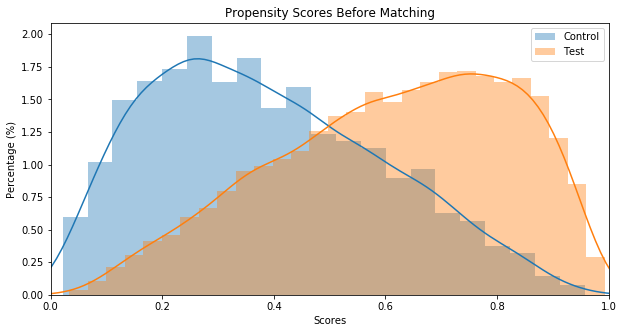

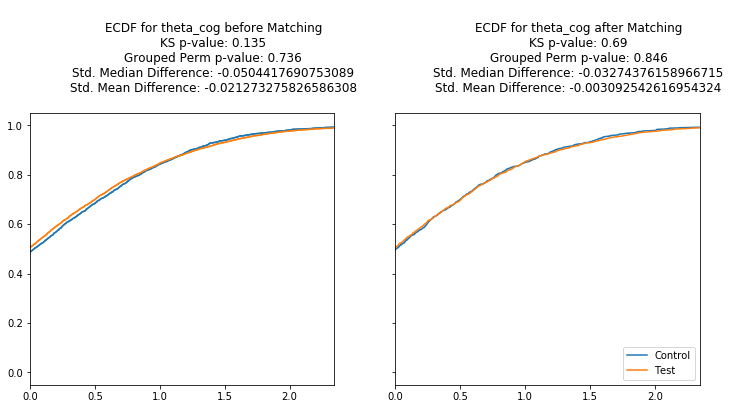

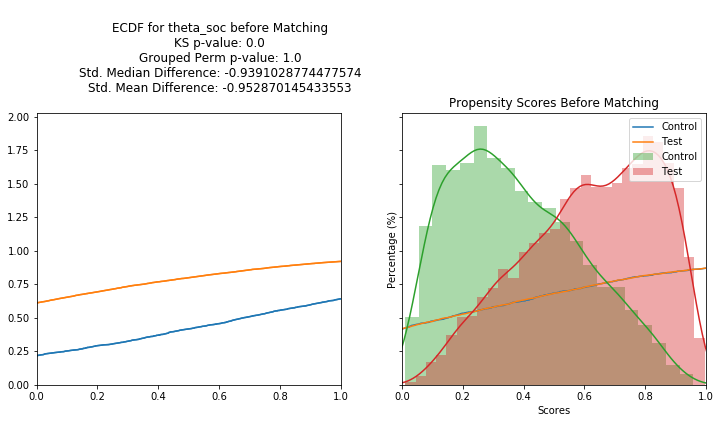

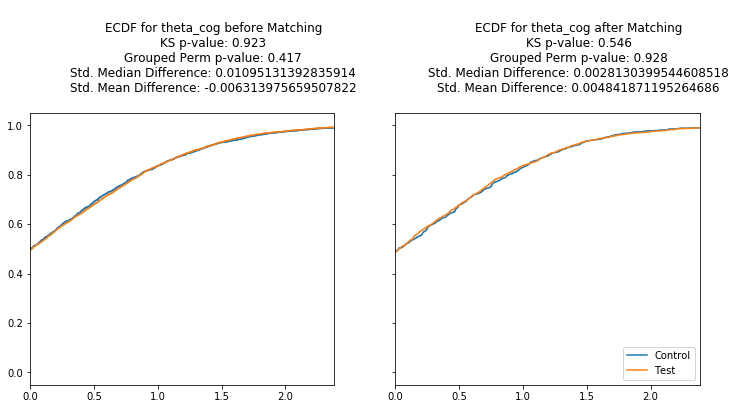

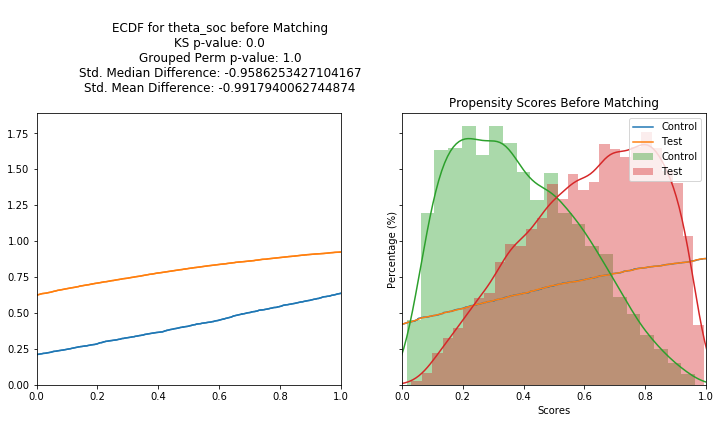

...

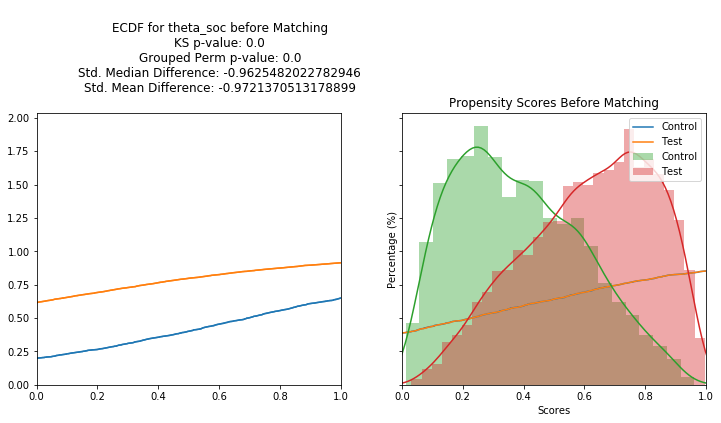

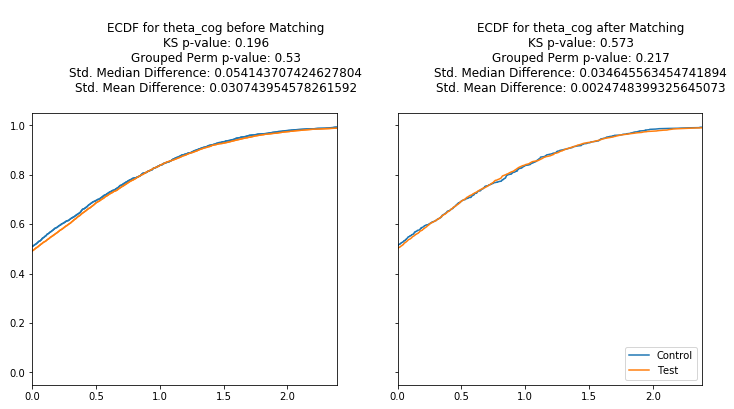

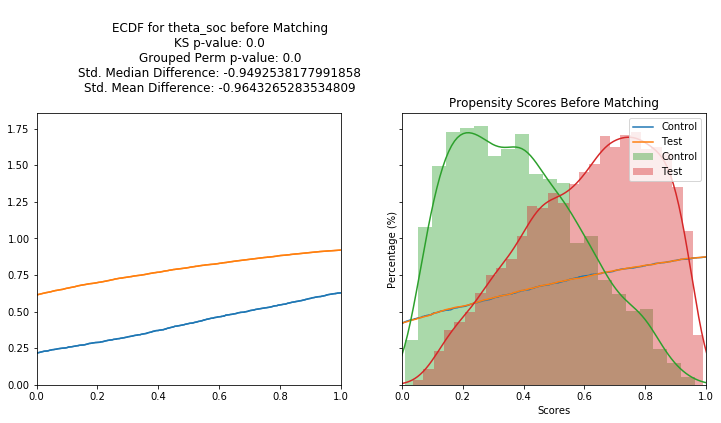

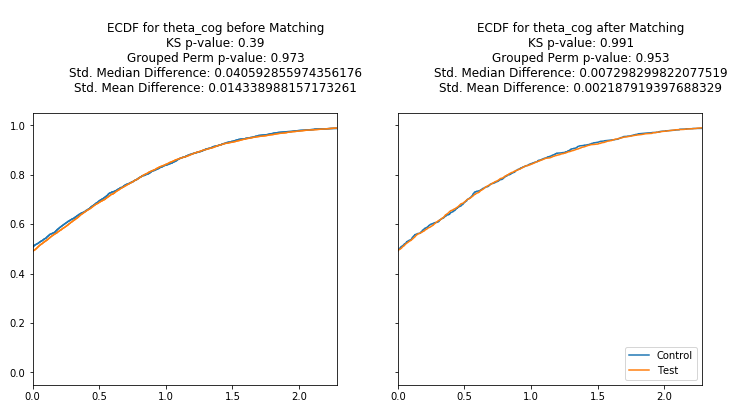

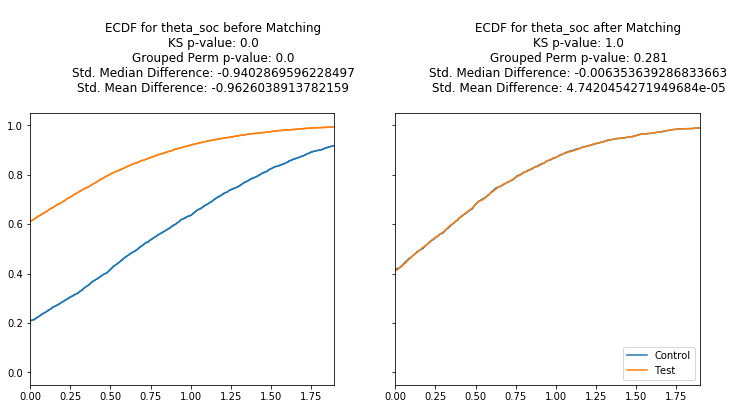

In [35]:
def matching_all(num, rho_1, rho_2, Buchstabe):
    data = cov_var(num, rho_1, rho_2, Buchstabe)
    a = data[0]
    b = data[1]
    m=Matcher(a,b,yvar='D',exclude=['level_0','u0','index','constant','M1','M2','M3','M4','u1','u2','uc','Y1','Y0','cost','experinced','Y','pred_values','expected_benefit','x','x3','D_1'])
    m.fit_scores(balance=True, nmodels=100)
    m.predict_scores()
    m.plot_scores()
    m.match(method="random", nmatches=1, threshold=0.0001)
    m.record_frequency()
    m.assign_weight_vector()
    df=m.matched_data
    cc = m.compare_continuous(return_table=True)
    return numpy.mean(df[df.D == 1]["Y"]) -  numpy.mean(df[df.D == 0]["Y"])- data[3]
res_2 = []
for x in range(0,50,1):
    calc = matching_all(10000,0,0,'W')
    print(calc)
    res_2.append(calc)
res_2

0.052792543956702034

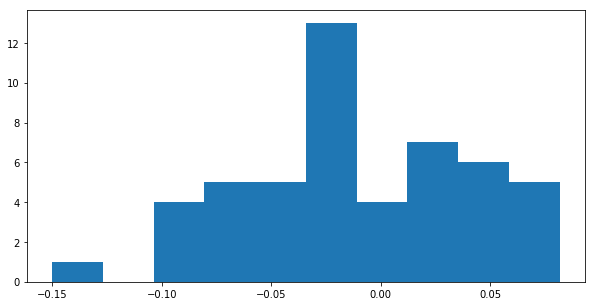

In [39]:
plt.hist(res_2)
numpy.asarray(res_2).std()

Formula:
D ~ M1+x3
n majority: 7206
n minority: 2794
Fitting Models on Balanced Samples: 1\100

/home/christian/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


Fitting Models on Balanced Samples: 100\100
Average Accuracy: 69.81%


/home/christian/anaconda3/lib/python3.7/site-packages/pymatch/Matcher.py:199: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.matched_data['match_id'] = match_ids
/home/christian/anaconda3/lib/python3.7/site-packages/pymatch/Matcher.py:200: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.matched_data['record_id'] = self.matched_data.index


-0.1039521439469725
Formula:
D ~ M1+x3
n majority: 7250
n minority: 2750
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.57%
-0.10389823975093315
Formula:
D ~ M1+x3
n majority: 7222
n minority: 2778
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.13%
-0.024626072326607296
Formula:
D ~ M1+x3
n majority: 7230
n minority: 2770
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 69.41%
-0.10068182776417822
Formula:
D ~ M1+x3
n majority: 7236
n minority: 2764
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.27%
-0.09993563632672953
Formula:
D ~ M1+x3
n majority: 7111
n minority: 2889
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.87%
-0.14249203645817154
Formula:
D ~ M1+x3
n majority: 7243
n minority: 2757
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.82%
-0.10125904297967381
Formula:
D ~ M1+x3
n majority: 7243
n minority: 2757
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 71.7%


/home/christian/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


-0.10969443362644538
Formula:
D ~ M1+x3
n majority: 7102
n minority: 2898
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.96%
-0.01764627669088248
Formula:
D ~ M1+x3
n majority: 7157
n minority: 2843
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.14%
-0.07557268384254567
Formula:
D ~ M1+x3
n majority: 7189
n minority: 2811
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.36%
-0.07430926024437734
Formula:
D ~ M1+x3
n majority: 7244
n minority: 2756
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.17%
-0.057195709194420075
Formula:
D ~ M1+x3
n majority: 7263
n minority: 2737
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.1%
-0.22602611168403852
Formula:
D ~ M1+x3
n majority: 7054
n minority: 2946
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.52%
-0.14527293646214268
Formula:
D ~ M1+x3
n majority: 7242
n minority: 2758
Fitting Models on Balanced Samples: 100\100
Average Accuracy: 70.32%

[-0.1039521439469725,
 -0.10389823975093315,
 -0.024626072326607296,
 -0.10068182776417822,
 -0.09993563632672953,
 -0.14249203645817154,
 -0.10125904297967381,
 -0.08898466175606168,
 -0.07092752146310621,
 -0.10969443362644538,
 -0.01764627669088248,
 -0.07557268384254567,
 -0.07430926024437734,
 -0.057195709194420075,
 -0.22602611168403852,
 -0.14527293646214268,
 -0.1586485059037931,
 -0.12716921660620817,
 -0.04318458150521198,
 -0.10893400714630275,
 -0.1164017748673345,
 -0.10146323221262521,
 -0.13443785063111702,
 -0.1365592491401405,
 -0.16990936177128257,
 -0.078490253072652,
 -0.1556119384750616,
 -0.14028909591046745,
 -0.11024901071208415,
 -0.21271588895044502,
 -0.028814050342002018,
 -0.08511702377211028,
 -0.1257775105804151,
 -0.16147349993734028,
 -0.17751667486772582,
 -0.15002983787234048,
 -0.0843665553977111,
 -0.1958420726558452,
 -0.11814454868936786,
 -0.0883538881241539,
 -0.06764981114697122,
 -0.07849418813457476,
 -0.13545364092763423,
 -0.160697800273807

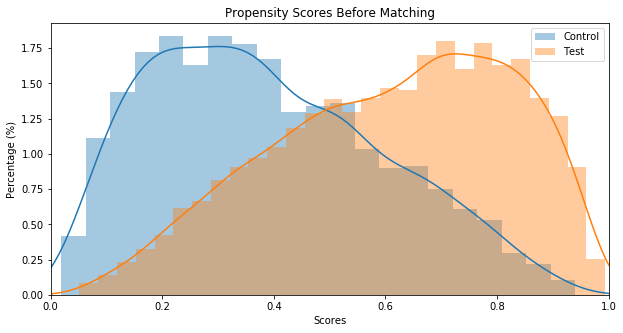

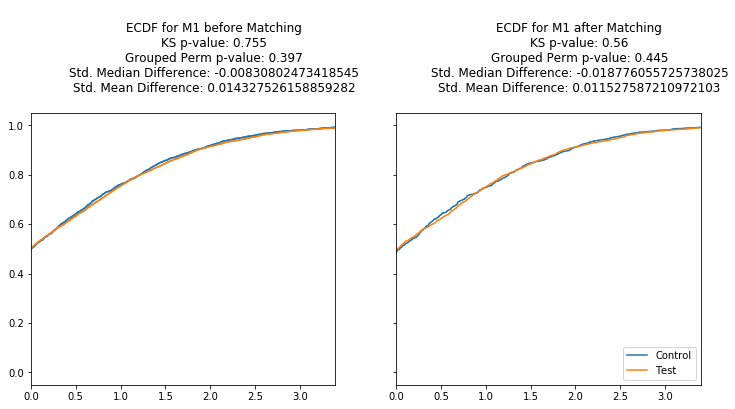

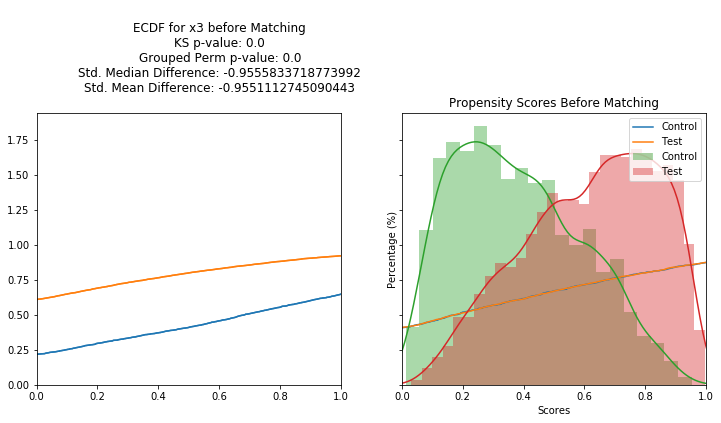

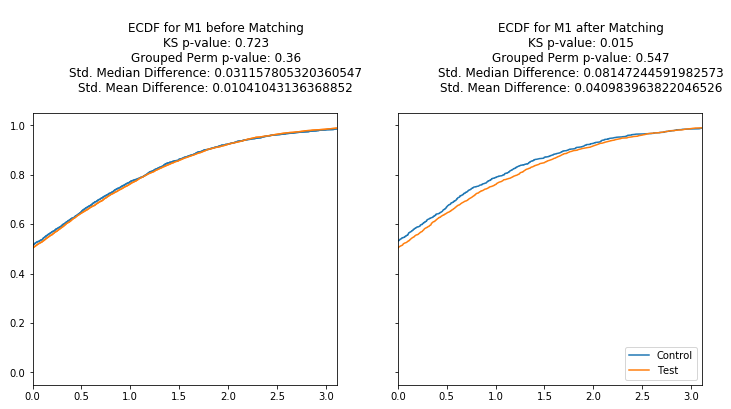

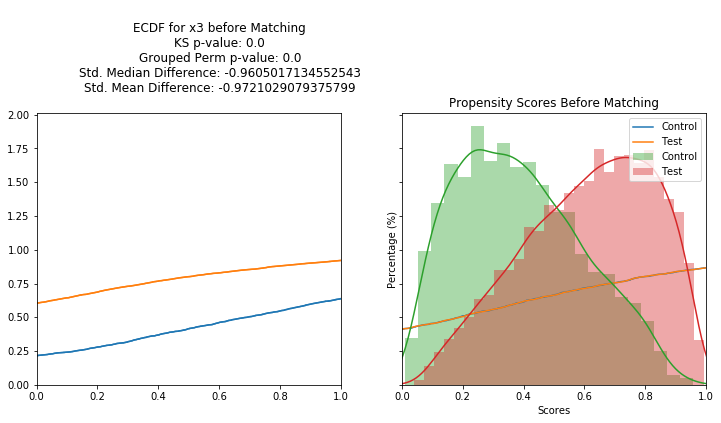

...

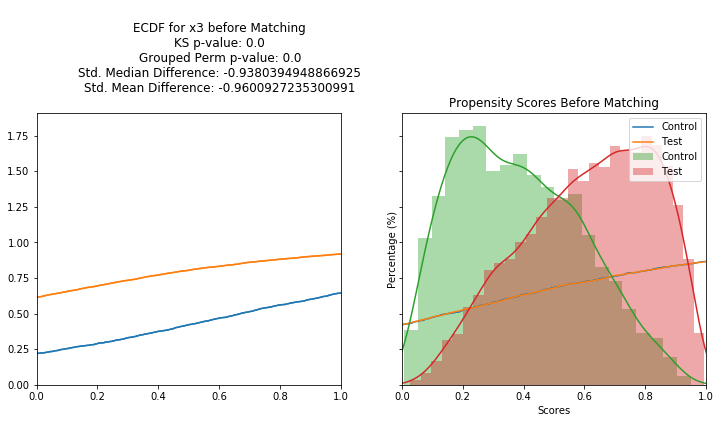

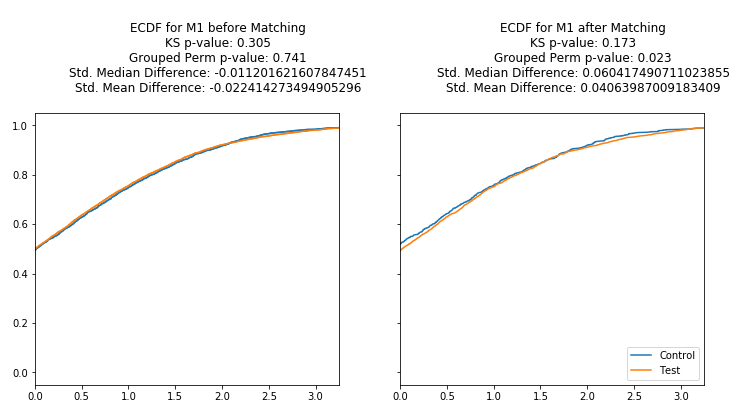

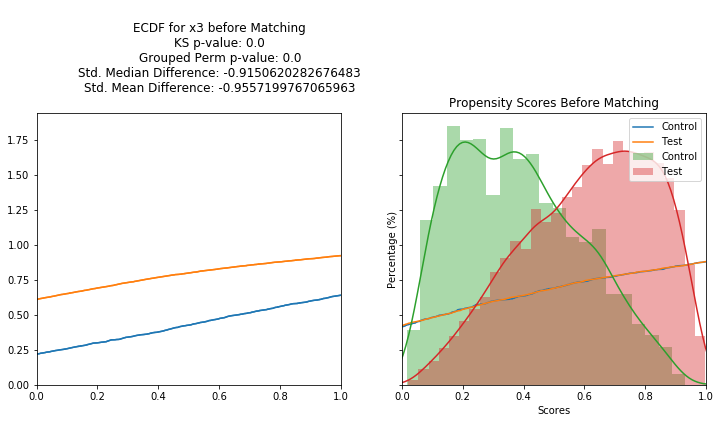

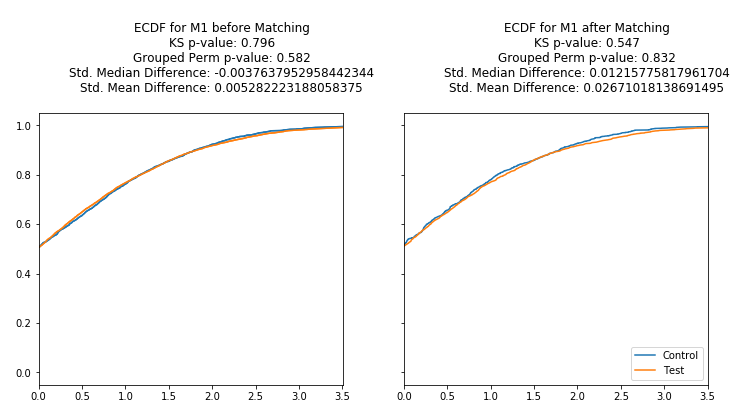

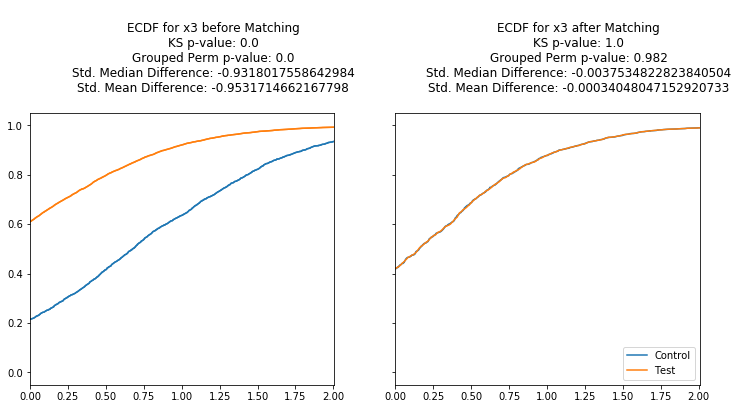

In [28]:
def matching_all(num, rho_1, rho_2, Buchstabe):
    data = cov_var(num, rho_1, rho_2, Buchstabe)
    a = data[0]
    b = data[1]
    m=Matcher(a,b,yvar='D',exclude=['level_0','u0','index','constant','theta_soc','theta_cog','M2','M3','M4','u1','u2','uc','Y1','Y0','cost','experinced','Y','pred_values','expected_benefit','x','D_1'])
    m.fit_scores(balance=True, nmodels=100)
    m.predict_scores()
    m.plot_scores()
    m.match(method="random", nmatches=1, threshold=0.0001)
    m.record_frequency()
    m.assign_weight_vector()
    df=m.matched_data
    cc = m.compare_continuous(return_table=True)
    return numpy.mean(df[df.D == 1]["Y"]) -  numpy.mean(df[df.D == 0]["Y"])- data[3]
res_3 = []
for x in range(0,50,1):
    calc = matching_all(10000,0,0,'W')
    print(calc)
    res_3.append(calc)
res_3

-0.1117161025858412

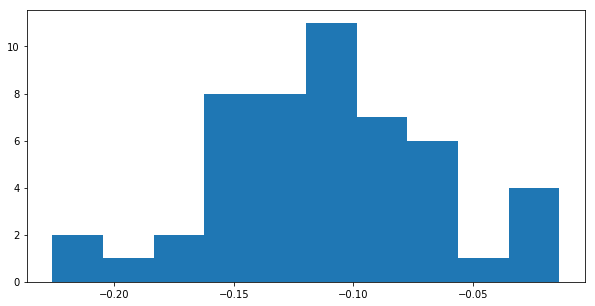

In [30]:
plt.hist(res_3)
numpy.asarray(res_3).mean()

In [ ]:
res.mean()
#res_2 = numpy.asarray(res_2)
#res_2.mean()
#res_3 = numpy.asarray(res_3)
#res_3.mean()

In [ ]:
def matching_all(num, rho_1, rho_2, Buchstabe):
    data = cov_var(num, rho_1, rho_2, Buchstabe)
    a = data[0]
    b = data[1]
    m=Matcher(a,b,yvar='D',exclude=['level_0','u0','index','constant','theta_cog','theta_soc','M1' ,'M2','M3','M4','u1','u2','uc','Y1','Y0','cost','experinced','Y','pred_values','expected_benefit','x','D_1'])
    m.fit_scores(balance=True, nmodels=100)
    m.predict_scores()
    m.plot_scores()
    m.match(method="random", nmatches=1, threshold=0.0001)
    m.record_frequency()
    m.assign_weight_vector()
    df=m.matched_data
    cc = m.compare_continuous(return_table=True)
    return numpy.mean(df[df.D == 1]["Y"]) -  numpy.mean(df[df.D == 0]["Y"])- data[3]
res_4 = []
for x in range(0,50,1):
    calc = matching_all(10000,0,0,'W')
    print(calc)
    res_4.append(calc)
res_4

In [39]:
res.std()
#numpy.asarray(res_4).mean()

0.025098600271057866

(array([2., 1., 5., 9., 8., 6., 9., 4., 2., 4.]),
 array([-0.14858279, -0.13776993, -0.12695707, -0.11614421, -0.10533135,
        -0.09451849, -0.08370564, -0.07289278, -0.06207992, -0.05126706,
        -0.0404542 ]),
 <a list of 10 Patch objects>)

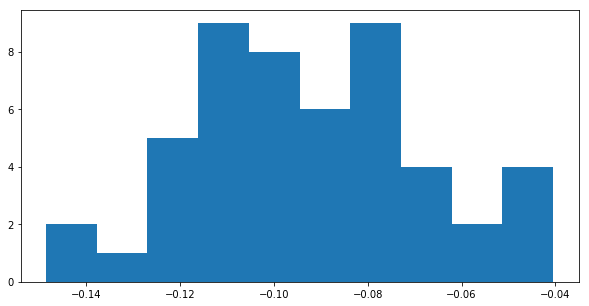

In [41]:
plt.hist(res_2)